<h1>MinMaxScaler</h1>

In [33]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

np.random.seed(40)

In [34]:
data = pd.read_csv("../data/our_data.csv")
prep_data = pd.read_csv("../data/our_data_preprocessed_MinMaxScaler.csv")

In [35]:
prep_data.columns

Index(['Price', 'Rating', 'processor_tier', 'num_cores', 'num_threads',
       'ram_memory', 'primary_storage_capacity', 'secondary_storage_capacity',
       'is_touch_screen', 'display_size', 'resolution_width',
       'resolution_height', 'year_of_warranty', 'total_number_of_pixels',
       'total_pixels_per_square_of_diag', 'gpu_brand_amd', 'gpu_brand_apple',
       'gpu_brand_intel', 'gpu_brand_nvidia', 'gpu_type_integrated',
       'OS_chrome', 'OS_other', 'OS_ubuntu', 'OS_windows', 'brand_acer',
       'brand_asus', 'brand_avita', 'brand_chuwi', 'brand_dell',
       'brand_fujitsu', 'brand_gigabyte', 'brand_honor', 'brand_hp',
       'brand_iball', 'brand_infinix', 'brand_jio', 'brand_lenovo', 'brand_lg',
       'brand_microsoft', 'brand_msi', 'brand_realme', 'brand_samsung',
       'brand_tecno', 'brand_ultimus', 'brand_walker', 'brand_wings',
       'brand_zebronics', 'processor_brand_amd', 'processor_brand_intel',
       'primary_storage_type_SSD'],
      dtype='object')

In [36]:
prep_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 792 entries, 0 to 791
Data columns (total 50 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Price                            792 non-null    float64
 1   Rating                           792 non-null    float64
 2   processor_tier                   792 non-null    int64  
 3   num_cores                        792 non-null    float64
 4   num_threads                      792 non-null    float64
 5   ram_memory                       792 non-null    float64
 6   primary_storage_capacity         792 non-null    float64
 7   secondary_storage_capacity       792 non-null    float64
 8   is_touch_screen                  792 non-null    int64  
 9   display_size                     792 non-null    float64
 10  resolution_width                 792 non-null    float64
 11  resolution_height                792 non-null    float64
 12  year_of_warranty      

<h1>Finding optimal number of clusters<h1>

<h3>1.Using elbow method<h3>

In [37]:
def count_wcss_scores(X, k_max):
    #  WCSS = within-cluster sum of squares
    scores = []
    for k in range(1, k_max+1):
        kmeans = KMeans(n_clusters=k, random_state=0)
        kmeans.fit(X)
        wcss = kmeans.score(X) * -1 # score returns -WCSS
        scores.append(wcss)
    return scores

<h3>2. Using silhouette score<h3>

In [38]:
def count_silhouette_scores(X, k_max):
    scores = []
    for k in range(2, k_max + 1):
        kmeans = KMeans(n_clusters=k, random_state=0)
        kmeans.fit(X)
        labels = kmeans.labels_
        score = silhouette_score(X, labels)
        scores.append(score)
    return scores


<h3>3. Using Calinski-Harabasz score<h3>

In [39]:
def count_calinski_harabasz_scores(X, k_max):
    scores = []
    for k in range(2, k_max + 1):  # Calinski-Harabasz score nie działa dla k=1
        kmeans = KMeans(n_clusters=k, random_state=0)
        kmeans.fit(X)
        labels = kmeans.labels_
        score = calinski_harabasz_score(X, labels)
        scores.append(score)
    return scores


<h3>4. Using Davies - Bouldin score<h3>

In [40]:
def count_davies_bouldin_scores(X, k_max):
    scores = []
    for k in range(2, k_max + 1):  # Davies-Bouldin score nie działa dla k=1
        kmeans = KMeans(n_clusters=k, random_state=0)
        kmeans.fit(X)
        labels = kmeans.labels_
        score = davies_bouldin_score(X, labels)
        scores.append(score)
    return scores

/Users/katebokhan/anaconda3/envs/6.86x/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/katebokhan/anaconda3/envs/6.86x/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/katebokhan/anaconda3/envs/6.86x/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/katebokhan/anaconda3/envs/6.86x/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: Fut

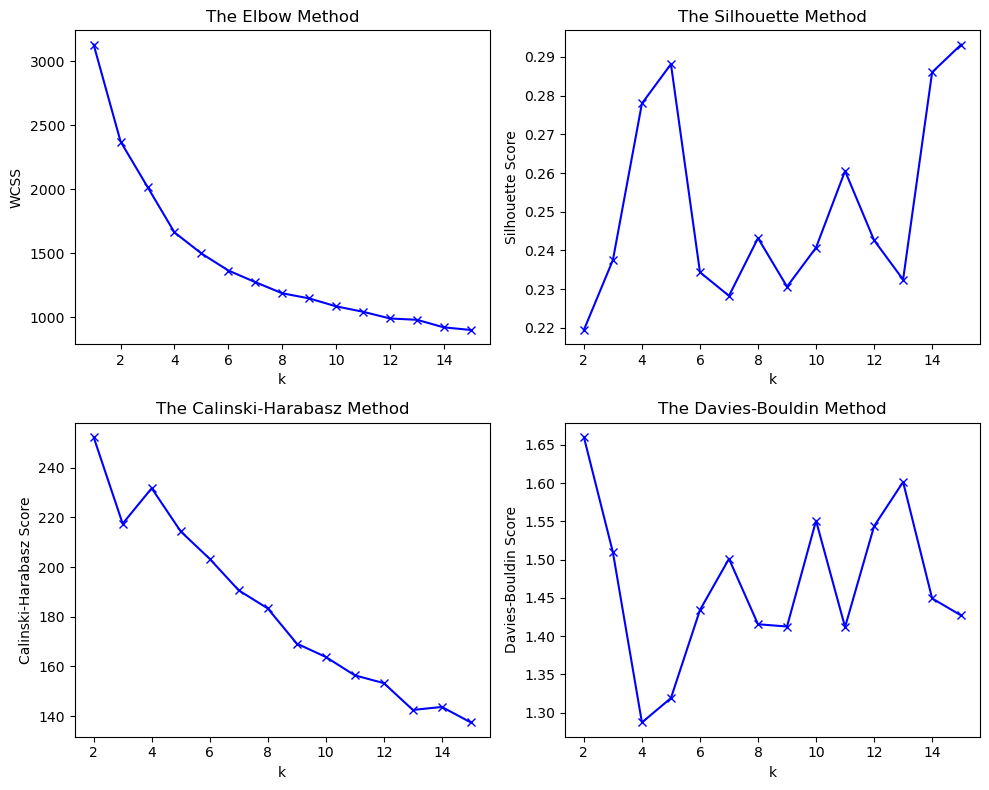

In [41]:
k_max = 15
wcss_vec = count_wcss_scores(prep_data, k_max)
silhouette_vec = count_silhouette_scores(prep_data, k_max)
calinski_harabasz_vec = count_calinski_harabasz_scores(prep_data, k_max)
davies_bouldin_vec = count_davies_bouldin_scores(prep_data, k_max)

x_ticks_wcss = list(range(1, len(wcss_vec) + 1))
x_ticks_silhouette = list(range(2, len(silhouette_vec) + 2))
x_ticks_calinski_harabasz = list(range(2, len(calinski_harabasz_vec) + 2))
x_ticks_davies_bouldin = list(range(2, len(davies_bouldin_vec) + 2))

fig, axs = plt.subplots(2, 2, figsize=(10, 8))

#wcss
axs[0, 0].plot(x_ticks_wcss, wcss_vec, 'bx-')
axs[0, 0].set_xlabel('k')
axs[0, 0].set_ylabel('WCSS')
axs[0, 0].set_title('The Elbow Method')

#silhouette
axs[0, 1].plot(x_ticks_silhouette, silhouette_vec, 'bx-')
axs[0, 1].set_xlabel('k')
axs[0, 1].set_ylabel('Silhouette Score')
axs[0, 1].set_title('The Silhouette Method')

#Calinski-Harabasz
axs[1, 0].plot(x_ticks_calinski_harabasz, calinski_harabasz_vec, 'bx-')
axs[1, 0].set_xlabel('k')
axs[1, 0].set_ylabel('Calinski-Harabasz Score')
axs[1, 0].set_title('The Calinski-Harabasz Method')

#Davies-Bouldin
axs[1, 1].plot(x_ticks_davies_bouldin, davies_bouldin_vec, 'bx-')
axs[1, 1].set_xlabel('k')
axs[1, 1].set_ylabel('Davies-Bouldin Score')
axs[1, 1].set_title('The Davies-Bouldin Method')

plt.tight_layout()
plt.show()

Based on the above plots, we choose k = 4 and k = 8 for clustering with KMeans.

<h1>Clustering with KMeans<h1>


In [42]:
k = 4
kmeans = KMeans(n_clusters=k, random_state=40)
prep_data['Cluster_k4'] = kmeans.fit_predict(prep_data)
# number of observations in each cluster
print(prep_data['Cluster_k4'].value_counts())
# mean values for each cluster
cluster_summary = prep_data.groupby('Cluster_k4').mean()
print(cluster_summary)


2    332
1    291
3    129
0     40
Name: Cluster_k4, dtype: int64
               Price    Rating  processor_tier  num_cores  num_threads  \
Cluster_k4                                                               
0           0.216039  0.173584        0.800000   0.083683     0.121022   
1           0.602390  0.634943        4.745704   0.617350     0.583643   
2           0.451255  0.420810        3.849398   0.504751     0.429162   
3           0.410069  0.444798        4.007752   0.394289     0.450992   

            ram_memory  primary_storage_capacity  secondary_storage_capacity  \
Cluster_k4                                                                     
0             0.122059                  0.400000                    0.015000   
1             0.392763                  0.731959                    0.022680   
2             0.295181                  0.682731                    0.004819   
3             0.284086                  0.678295                    0.000000   

       

/Users/katebokhan/anaconda3/envs/6.86x/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


<h1>PCA<h1>

/Users/katebokhan/anaconda3/envs/6.86x/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/katebokhan/anaconda3/envs/6.86x/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


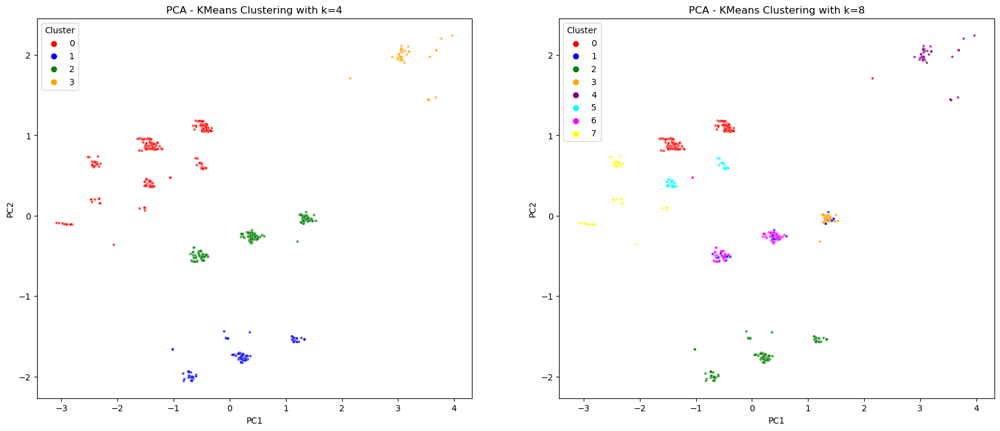

In [43]:
kmeans_k4 = KMeans(n_clusters=4, random_state=40)
data['Cluster_k4'] = kmeans_k4.fit_predict(prep_data)


kmeans_k8 = KMeans(n_clusters=8, random_state=40)
data['Cluster_k8'] = kmeans_k8.fit_predict(prep_data)


pca = PCA(n_components=2)
principal_components_k4 = pca.fit_transform(prep_data)
principal_components_k8 = pca.fit_transform(prep_data)

df_pca_k4 = pd.DataFrame(data=principal_components_k4, columns=['PC1', 'PC2'])
df_pca_k4['Cluster'] = data['Cluster_k4']

df_pca_k8 = pd.DataFrame(data=principal_components_k8, columns=['PC1', 'PC2'])
df_pca_k8['Cluster'] = data['Cluster_k8']

colors = {
    0: "red",
    1: "blue",
    2: "green",
    3: "orange",
    4: "purple",
    5: "cyan",
    6: "magenta",
    7: "yellow",
    8: "brown",
    9: "black"
}

fig, ax = plt.subplots(1, 2, figsize=(20, 8))

sns.scatterplot(x='PC1', y='PC2', hue='Cluster', palette=colors, data=df_pca_k4, s=10, ax=ax[0], alpha=0.7)
ax[0].set_title('PCA - KMeans Clustering with k=4')

sns.scatterplot(x='PC1', y='PC2', hue='Cluster', palette=colors, data=df_pca_k8, s=10, ax=ax[1], alpha=0.7)
ax[1].set_title('PCA - KMeans Clustering with k=8')

plt.show()

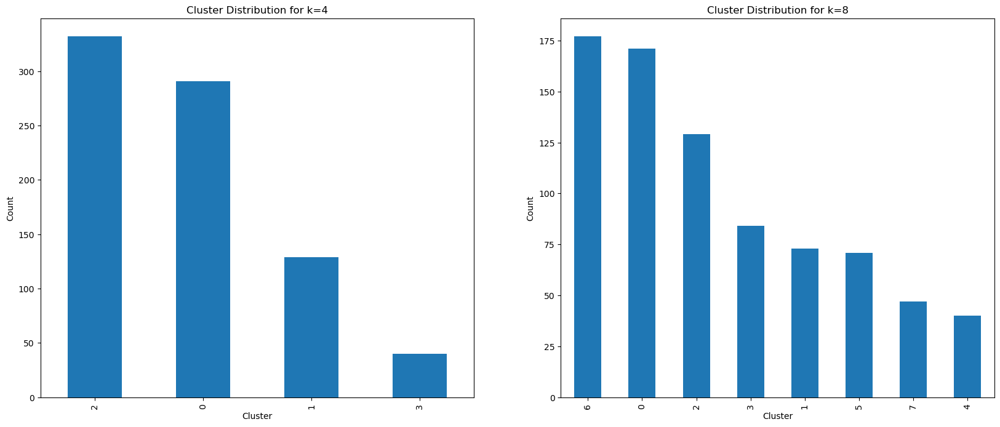

In [47]:
fig, ax = plt.subplots(1, 2, figsize=(20, 8))

data['Cluster_k4'].value_counts().plot(kind='bar', ax=ax[0])
ax[0].set_title('Cluster Distribution for k=4')
ax[0].set_xlabel('Cluster')
ax[0].set_ylabel('Count')

data['Cluster_k8'].value_counts().plot(kind='bar', ax=ax[1])
ax[1].set_title('Cluster Distribution for k=8')
ax[1].set_xlabel('Cluster')
ax[1].set_ylabel('Count')

plt.show()

### Exploration of Clusters (k=4)

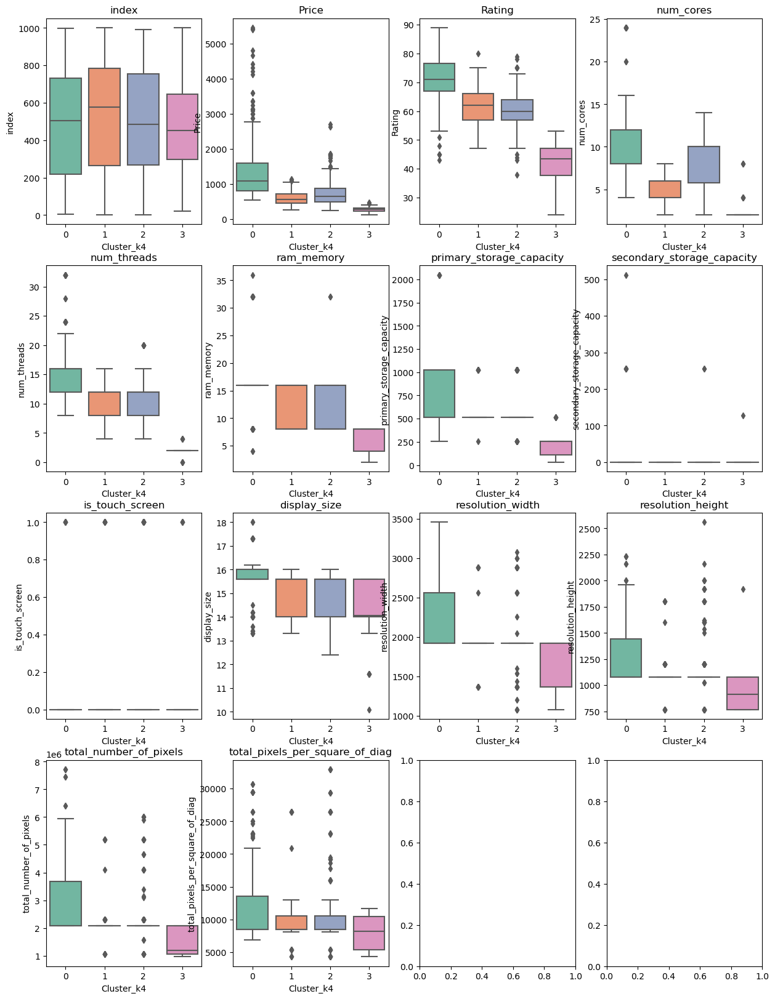

In [120]:
fig, axes = plt.subplots(4, 4, figsize=(15, 4 * 5))

axes = axes.flatten()

i=0
for column in data.columns:
    if column != 'Cluster_k4' and (type(data[column][0]) == np.float64 or type(data[column][0]) == np.int64):
        sns.boxplot(x='Cluster_k4', y=column, data=data, ax = axes[i], palette="Set2")
        axes[i].set_title(column)
        i+=1

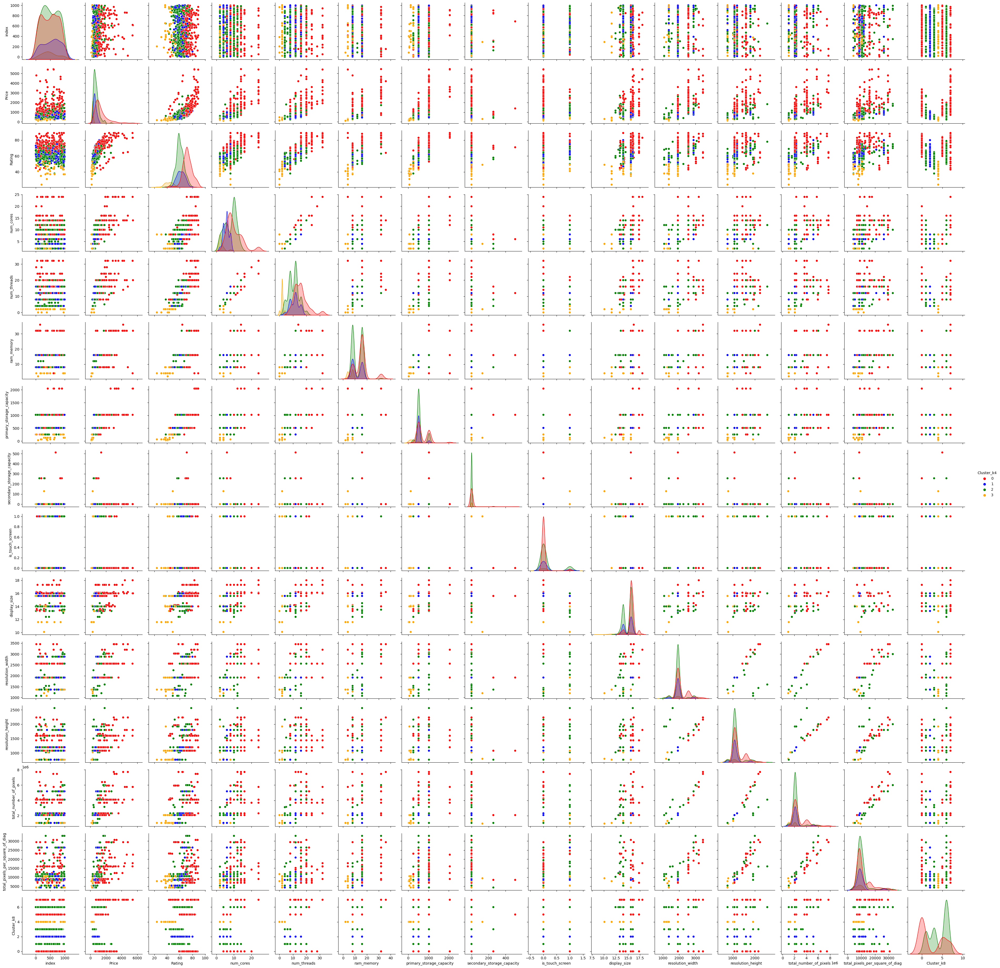

In [122]:
sns.pairplot(data, hue='Cluster_k4', palette=colors)

/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_6288/517966095.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_6288/517966095.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_6288/517966095.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_6288/517966095.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_6288/517966095.py:11: UserWarning: FixedFormatter sho

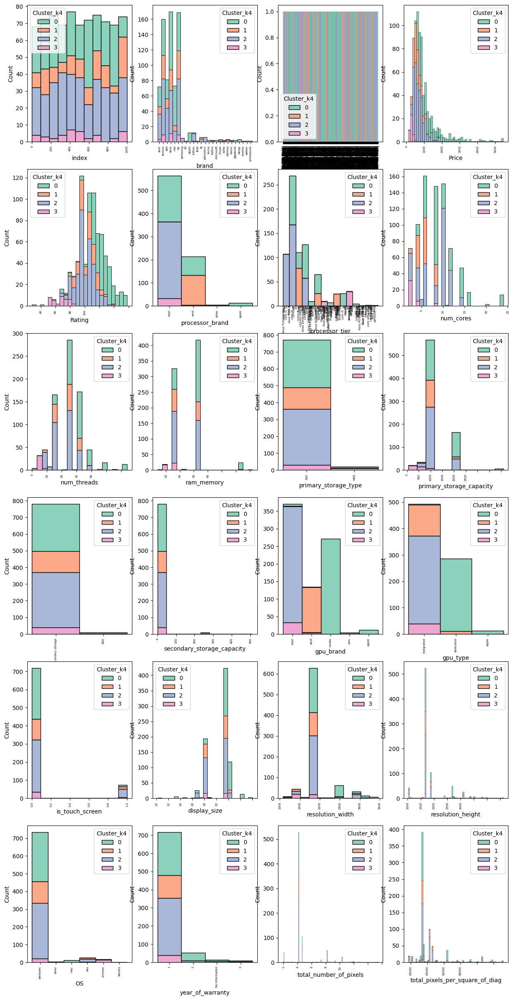

In [116]:
fig, axes = plt.subplots(6, 4, figsize=(15, 6 * 5))

axes = axes.flatten()

i=0

for i, column in enumerate(data.columns):
    if column != 'Cluster_k8' and column != 'Cluster_k4':
        sns.histplot(data=data, x=column, hue="Cluster_k4", multiple="stack", ax=axes[i], palette='Set2')
        axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
        axes[i].tick_params(axis='x', labelsize=5)
        axes[i].set_xlabel(column)
        i+=1

### Exploration of Clusters (k=8)

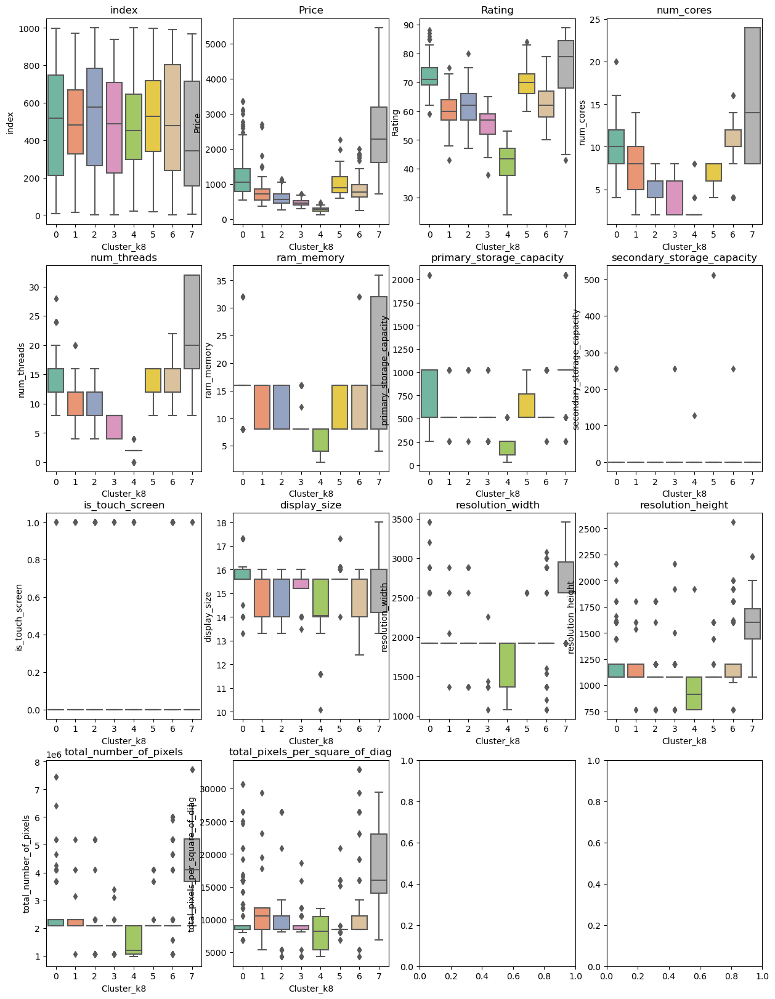

In [123]:
fig, axes = plt.subplots(4, 4, figsize=(15, 4 * 5))

axes = axes.flatten()

i=0
for column in data.columns:
    if column != 'Cluster_k8' and (type(data[column][0]) == np.float64 or type(data[column][0]) == np.int64):
        sns.boxplot(x='Cluster_k8', y=column, data=data, ax = axes[i], palette="Set2")
        axes[i].set_title(column)
        i+=1

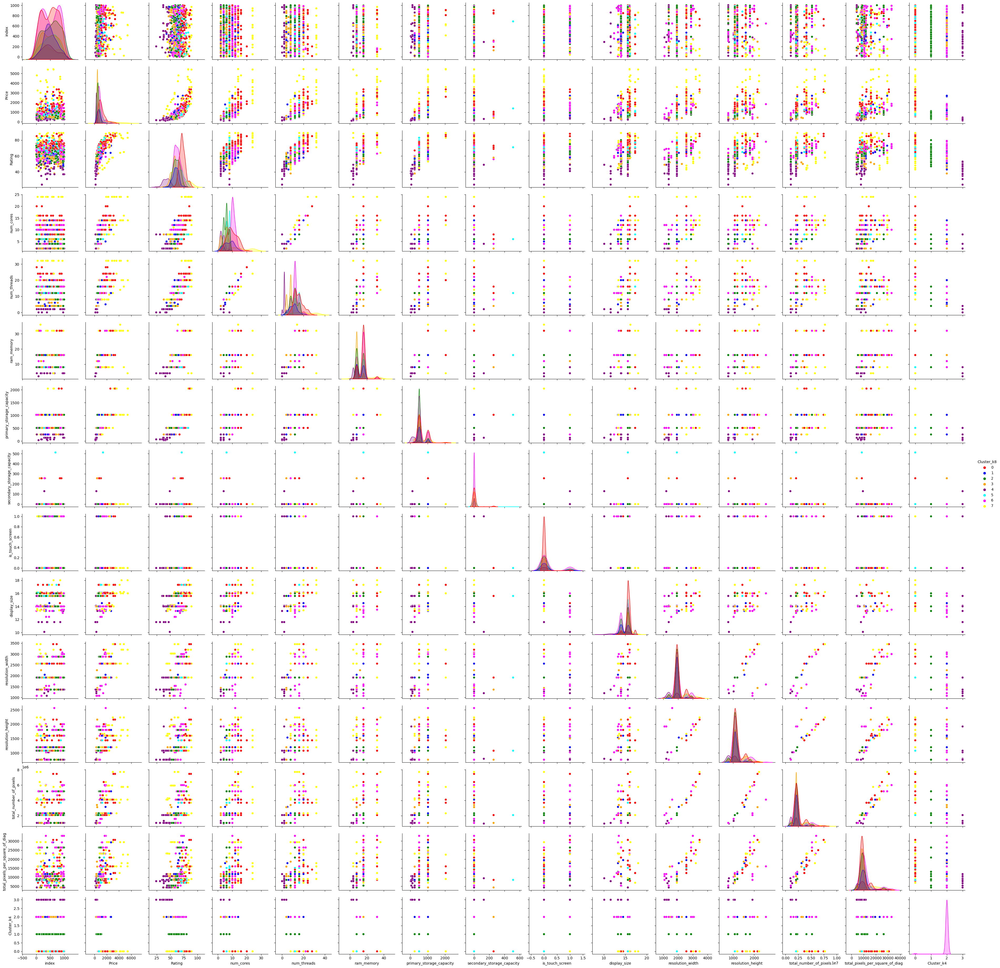

In [31]:
sns.pairplot(data, hue='Cluster_k8', palette=colors)

/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_6288/3317267338.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_6288/3317267338.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_6288/3317267338.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_6288/3317267338.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_6288/3317267338.py:10: UserWarning: FixedFormatte

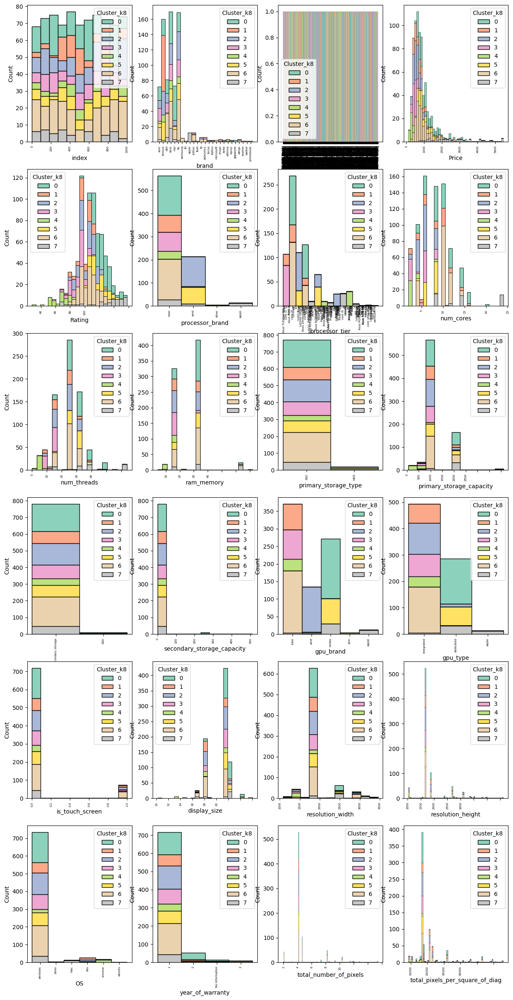

In [124]:
fig, axes = plt.subplots(6, 4, figsize=(15, 6 * 5))

axes = axes.flatten()

i=0

for i, column in enumerate(data.columns):
    if column != 'Cluster_k8' and column != 'Cluster_k4':
        sns.histplot(data=data, x=column, hue="Cluster_k8", multiple="stack", ax=axes[i], palette='Set2')
        axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
        axes[i].tick_params(axis='x', labelsize=5)
        axes[i].set_xlabel(column)
        i+=1

<h1>StandardScaler</h1>

In [133]:
data = pd.read_csv("../data/our_data.csv")
prep_data = pd.read_csv("../data/our_data_preprocessed_StandardScaler.csv")

/Users/katebokhan/anaconda3/envs/6.86x/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/katebokhan/anaconda3/envs/6.86x/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/katebokhan/anaconda3/envs/6.86x/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/katebokhan/anaconda3/envs/6.86x/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: Fut

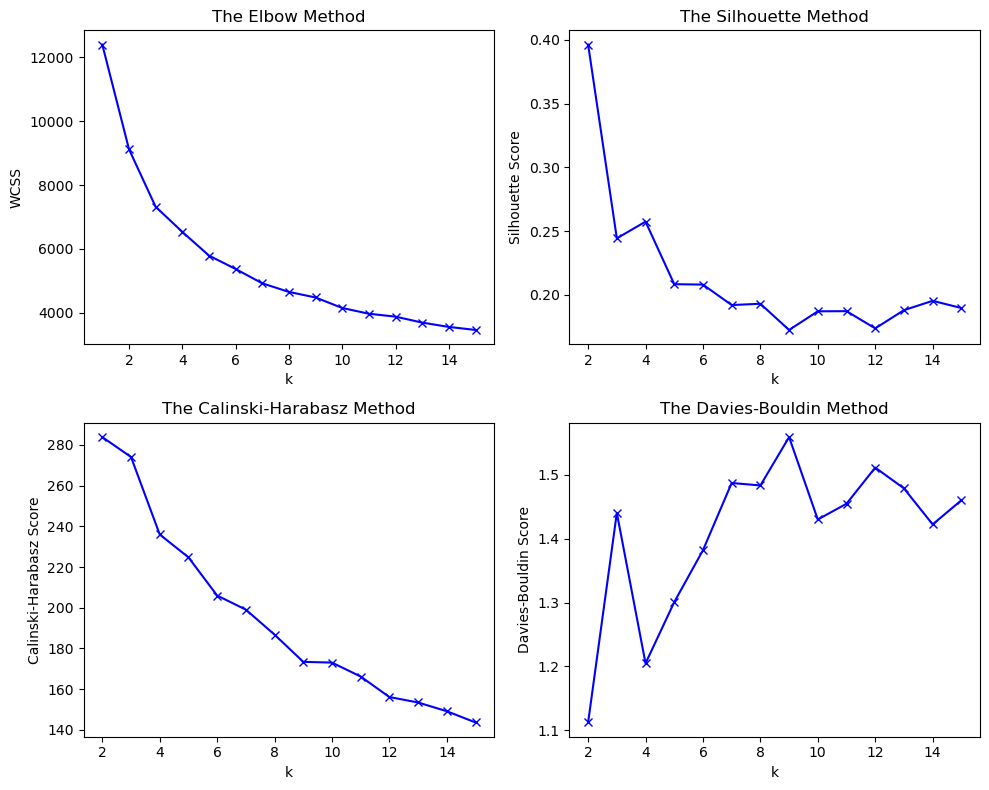

In [134]:
k_max = 15
wcss_vec = count_wcss_scores(prep_data, k_max)
silhouette_vec = count_silhouette_scores(prep_data, k_max)
calinski_harabasz_vec = count_calinski_harabasz_scores(prep_data, k_max)
davies_bouldin_vec = count_davies_bouldin_scores(prep_data, k_max)

x_ticks_wcss = list(range(1, len(wcss_vec) + 1))
x_ticks_silhouette = list(range(2, len(silhouette_vec) + 2))
x_ticks_calinski_harabasz = list(range(2, len(calinski_harabasz_vec) + 2))
x_ticks_davies_bouldin = list(range(2, len(davies_bouldin_vec) + 2))

fig, axs = plt.subplots(2, 2, figsize=(10, 8))

#wcss
axs[0, 0].plot(x_ticks_wcss, wcss_vec, 'bx-')
axs[0, 0].set_xlabel('k')
axs[0, 0].set_ylabel('WCSS')
axs[0, 0].set_title('The Elbow Method')

#silhouette
axs[0, 1].plot(x_ticks_silhouette, silhouette_vec, 'bx-')
axs[0, 1].set_xlabel('k')
axs[0, 1].set_ylabel('Silhouette Score')
axs[0, 1].set_title('The Silhouette Method')

#Calinski-Harabasz
axs[1, 0].plot(x_ticks_calinski_harabasz, calinski_harabasz_vec, 'bx-')
axs[1, 0].set_xlabel('k')
axs[1, 0].set_ylabel('Calinski-Harabasz Score')
axs[1, 0].set_title('The Calinski-Harabasz Method')

#Davies-Bouldin
axs[1, 1].plot(x_ticks_davies_bouldin, davies_bouldin_vec, 'bx-')
axs[1, 1].set_xlabel('k')
axs[1, 1].set_ylabel('Davies-Bouldin Score')
axs[1, 1].set_title('The Davies-Bouldin Method')

plt.tight_layout()
plt.show()

Based on the above plots, we choose k = 2 and k = 4 for clustering with KMeans.

<h1>PCA</h1>

/Users/katebokhan/anaconda3/envs/6.86x/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/katebokhan/anaconda3/envs/6.86x/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


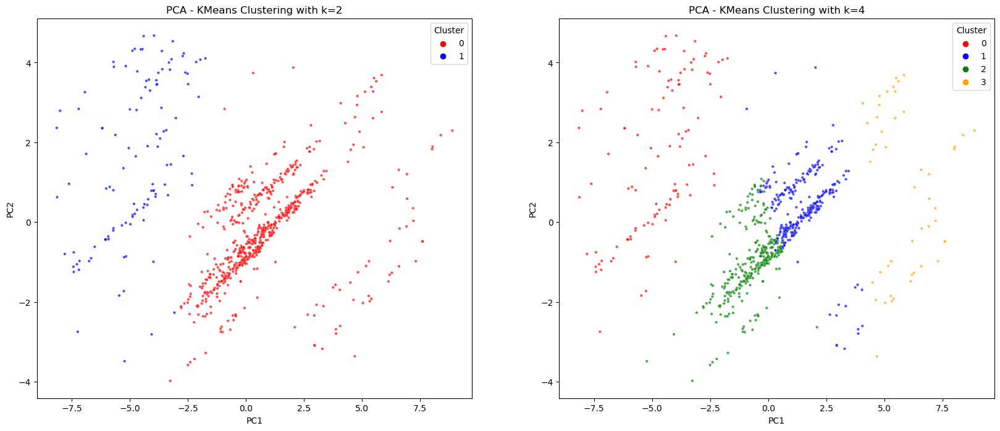

In [135]:

kmeans_k2 = KMeans(n_clusters=2, random_state=40)
data['Cluster_k2'] = kmeans_k2.fit_predict(prep_data)


kmeans_k4 = KMeans(n_clusters=4, random_state=40)
data['Cluster_k4'] = kmeans_k4.fit_predict(prep_data)


pca = PCA(n_components=2)
principal_components_k2 = pca.fit_transform(prep_data)
principal_components_k4 = pca.fit_transform(prep_data)

df_pca_k2 = pd.DataFrame(data=principal_components_k2, columns=['PC1', 'PC2'])
df_pca_k2['Cluster'] = data['Cluster_k2']

df_pca_k4 = pd.DataFrame(data=principal_components_k4, columns=['PC1', 'PC2'])
df_pca_k4['Cluster'] = data['Cluster_k4']

colors = {
    0: "red",
    1: "blue",
    2: "green",
    3: "orange",
    4: "purple",
    5: "cyan",
    6: "magenta",
    7: "yellow",
    8: "brown",
    9: "black"
}

fig, ax = plt.subplots(1, 2, figsize=(20, 8))

sns.scatterplot(x='PC1', y='PC2', hue='Cluster', palette=colors, data=df_pca_k2, s=10, ax=ax[0], alpha=0.7)
ax[0].set_title('PCA - KMeans Clustering with k=2')

sns.scatterplot(x='PC1', y='PC2', hue='Cluster', palette=colors, data=df_pca_k4, s=10, ax=ax[1], alpha=0.7)
ax[1].set_title('PCA - KMeans Clustering with k=4')

plt.show()

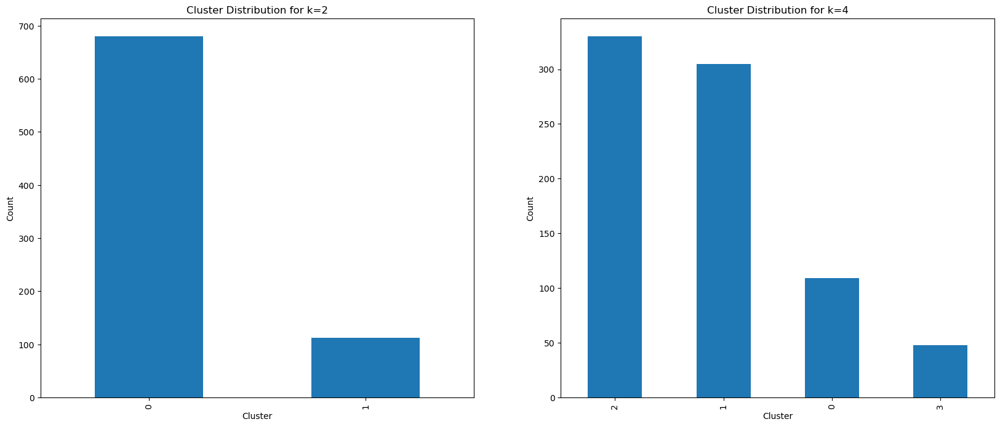

In [136]:
fig, ax = plt.subplots(1, 2, figsize=(20, 8))

data['Cluster_k2'].value_counts().plot(kind='bar', ax=ax[0])
ax[0].set_title('Cluster Distribution for k=2')
ax[0].set_xlabel('Cluster')
ax[0].set_ylabel('Count')

data['Cluster_k4'].value_counts().plot(kind='bar', ax=ax[1])
ax[1].set_title('Cluster Distribution for k=4')
ax[1].set_xlabel('Cluster')
ax[1].set_ylabel('Count')

plt.show()

### Exploration of Clusters (k=2)

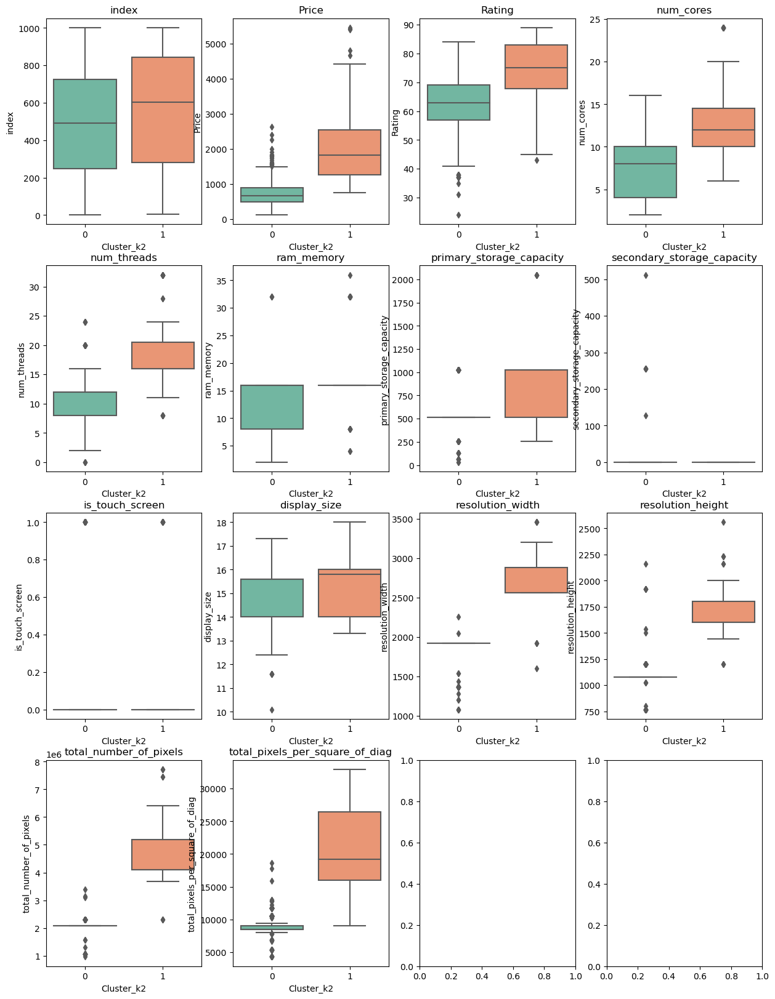

In [137]:
fig, axes = plt.subplots(4, 4, figsize=(15, 4 * 5))

axes = axes.flatten()

i=0
for column in data.columns:
    if column != 'Cluster_k2' and (type(data[column][0]) == np.float64 or type(data[column][0]) == np.int64):
        sns.boxplot(x='Cluster_k2', y=column, data=data, ax = axes[i], palette="Set2")
        axes[i].set_title(column)
        i+=1

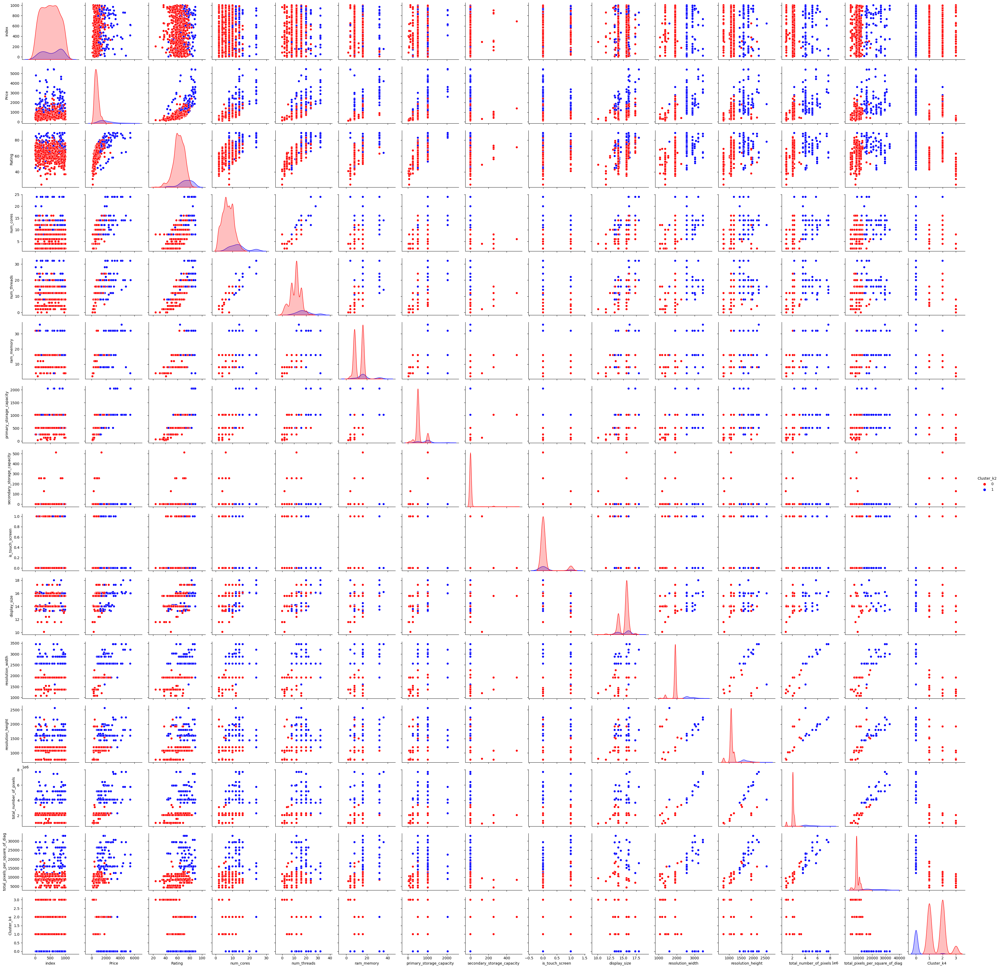

In [138]:
sns.pairplot(data, hue='Cluster_k2', palette=colors)

/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_6288/2720505331.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_6288/2720505331.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_6288/2720505331.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_6288/2720505331.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_6288/2720505331.py:10: UserWarning: FixedFormatte

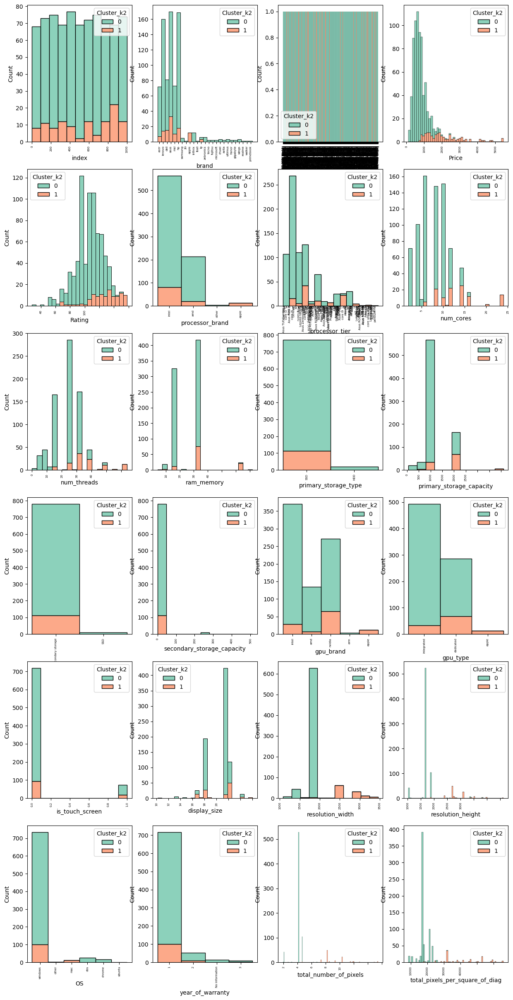

In [139]:
fig, axes = plt.subplots(6, 4, figsize=(15, 6 * 5))

axes = axes.flatten()

i=0

for i, column in enumerate(data.columns):
    if column != 'Cluster_k2' and column != 'Cluster_k4':
        sns.histplot(data=data, x=column, hue="Cluster_k2", multiple="stack", ax=axes[i], palette='Set2')
        axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
        axes[i].tick_params(axis='x', labelsize=5)
        axes[i].set_xlabel(column)
        i+=1

### Exploration of Clusters (k=4)

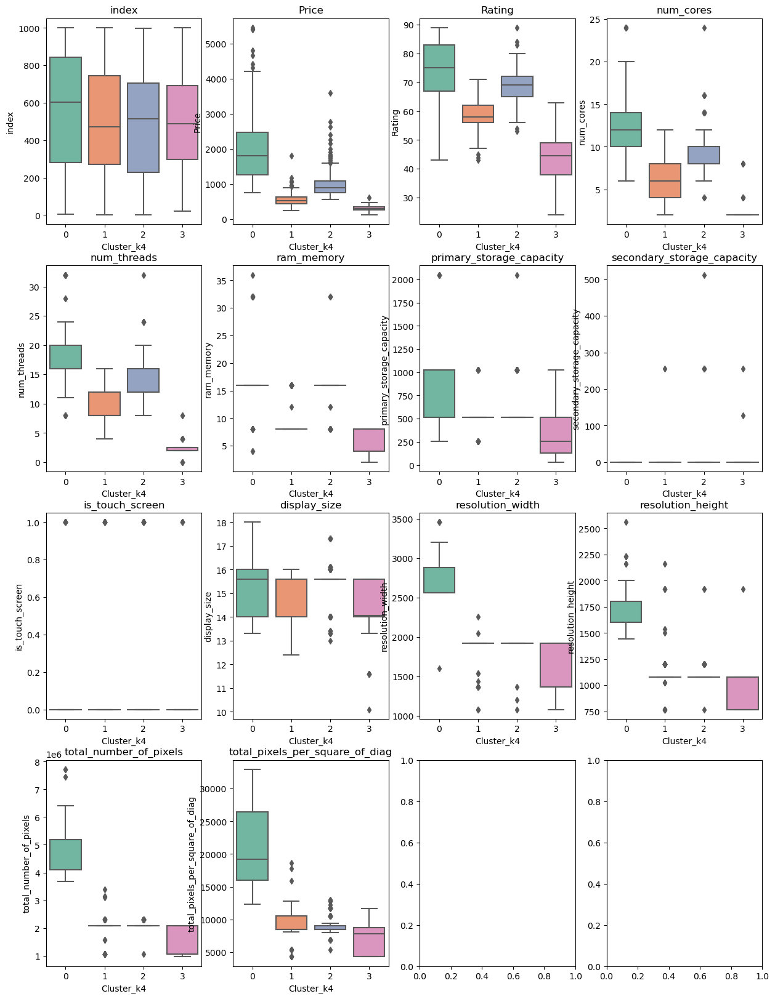

In [140]:
fig, axes = plt.subplots(4, 4, figsize=(15, 4 * 5))

axes = axes.flatten()

i=0
for column in data.columns:
    if column != 'Cluster_k4' and (type(data[column][0]) == np.float64 or type(data[column][0]) == np.int64):
        sns.boxplot(x='Cluster_k4', y=column, data=data, ax = axes[i], palette="Set2")
        axes[i].set_title(column)
        i+=1

/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_6288/2092771039.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_6288/2092771039.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_6288/2092771039.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_6288/2092771039.py:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
/var/folders/y9/p941jysn0ddb8zkx38rpntd80000gn/T/ipykernel_6288/2092771039.py:10: UserWarning: FixedFormatte

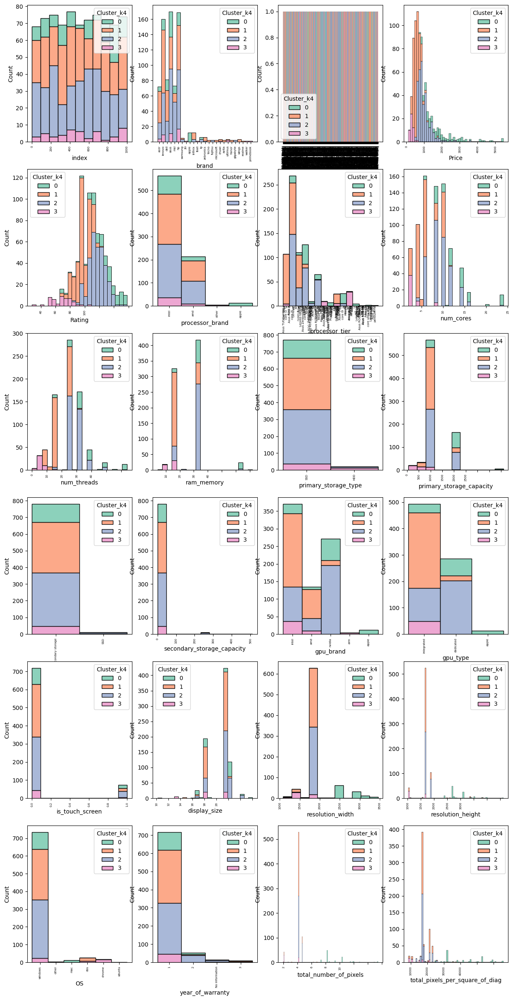

In [141]:
fig, axes = plt.subplots(6, 4, figsize=(15, 6 * 5))

axes = axes.flatten()

i=0

for i, column in enumerate(data.columns):
    if column != 'Cluster_k4' and column != 'Cluster_k2':
        sns.histplot(data=data, x=column, hue="Cluster_k4", multiple="stack", ax=axes[i], palette='Set2')
        axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
        axes[i].tick_params(axis='x', labelsize=5)
        axes[i].set_xlabel(column)
        i+=1